In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pathlib import Path
import random
import PIL



In [ ]:
# Seed Everything to reproduce results
def seed_everything(seed=42):
    tf.random.set_seed(seed)
    np.random.seed(seed)
    random.seed(seed)

seed_everything()



In [ ]:
# Define constants
BATCH_SIZE = 32
TARGET_SIZE = (224, 224)
DATASET_DIR = "/content/drive/MyDrive/Colab Notebooks/CORAL REEF/USE"



In [ ]:
# Convert image paths to a dataframe
def convert_path_to_df(dataset_dir):
    image_dir = Path(dataset_dir)
    filepaths = list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.jpeg')) + list(image_dir.glob(r'**/*.png'))
    labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))
    filepaths = pd.Series(filepaths, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')
    image_df = pd.concat([filepaths, labels], axis=1)
    return image_df

# Load and preprocess the dataset
image_df = convert_path_to_df(DATASET_DIR)



In [ ]:
# Check for corrupted images
for img_p in Path(DATASET_DIR).rglob("*.jpg"):
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
        print(img_p)



<ipython-input-7-85d520660002>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='pastel', ax=axes[1])
<ipython-input-7-85d520660002>:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1].set_xticklabels(label_counts.index, rotation=45)


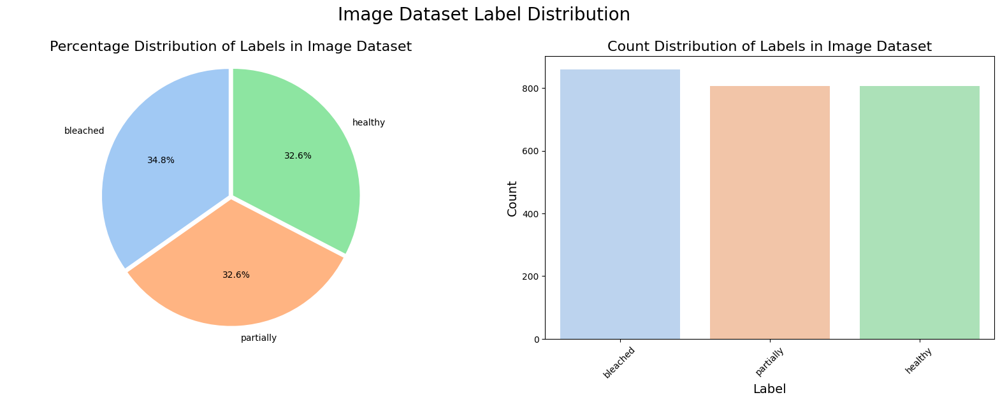

In [ ]:
# Data distribution visualization
label_counts = image_df['Label'].value_counts()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
colors = sns.color_palette('pastel', len(label_counts))
axes[0].pie(label_counts.values, labels=label_counts.index, autopct='%1.1f%%', startangle=90, colors=colors, explode=[0.02]*len(label_counts))
axes[0].axis('equal')
axes[0].set_title('Percentage Distribution of Labels in Image Dataset', fontsize=16)
sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='pastel', ax=axes[1])
axes[1].set_title('Count Distribution of Labels in Image Dataset', fontsize=16)
axes[1].set_xlabel('Label', fontsize=14)
axes[1].set_ylabel('Count', fontsize=14)
axes[1].set_xticklabels(label_counts.index, rotation=45)
fig.suptitle('Image Dataset Label Distribution', fontsize=20)
fig.subplots_adjust(top=0.85)
plt.show()




In [ ]:
!pip install scikit-learn
from sklearn.model_selection import train_test_split

In [ ]:
# Split the data into training and testing sets
train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=42)



In [ ]:
# Data generators with augmentation for training and validation sets
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg19.preprocess_input,
    validation_split=0.2,
    horizontal_flip=True,
    rotation_range=10,
    zoom_range=0.1,
    shear_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1
)



In [ ]:
test_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)


In [ ]:
train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

val_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

test_generator = test_datagen.flow_from_dataframe(
    test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 1584 validated image filenames belonging to 3 classes.
Found 395 validated image filenames belonging to 3 classes.
Found 495 validated image filenames belonging to 3 classes.


In [ ]:
# Load the pre-trained VGG19 model and fine-tune it
base_model = tf.keras.applications.VGG19(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False



80134624/80134624 [==============================] - 4s 0us/step


In [ ]:
# Add custom layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
outputs = Dense(3, activation='softmax')(x)



In [ ]:
# Create the model
model = Model(inputs=base_model.input, outputs=outputs)

# Compile the model
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
checkpoint_path = "coral_classification_checkpoint.h5"
checkpoint_callback = ModelCheckpoint(checkpoint_path, save_weights_only=True, monitor="val_accuracy", save_best_only=True)
early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-7)



In [ ]:
# Train the model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=50,
    callbacks=[early_stopping, checkpoint_callback, reduce_lr]
)



Epoch 1/50
50/50 [==============================] - 45s 846ms/step - loss: 1.3828 - accuracy: 0.5013 - val_loss: 0.8889 - val_accuracy: 0.6430 - lr: 0.0010
Epoch 2/50
50/50 [==============================] - 38s 771ms/step - loss: 1.0412 - accuracy: 0.6117 - val_loss: 0.6599 - val_accuracy: 0.7316 - lr: 0.0010
Epoch 3/50
50/50 [==============================] - 34s 678ms/step - loss: 0.8955 - accuracy: 0.6439 - val_loss: 0.5864 - val_accuracy: 0.7595 - lr: 0.0010
Epoch 4/50
50/50 [==============================] - 38s 756ms/step - loss: 0.8195 - accuracy: 0.6673 - val_loss: 0.5830 - val_accuracy: 0.7646 - lr: 0.0010
Epoch 5/50
50/50 [==============================] - 34s 678ms/step - loss: 0.7288 - accuracy: 0.7096 - val_loss: 0.5582 - val_accuracy: 0.7873 - lr: 0.0010
Epoch 6/50
50/50 [==============================] - 35s 696ms/step - loss: 0.7527 - accuracy: 0.6900 - val_loss: 0.5173 - val_accuracy: 0.7848 - lr: 0.0010
Epoch 7/50
50/50 [==============================] - 34s 679ms/st

In [ ]:

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy:.2f}")

16/16 [==============================] - 7s 458ms/step - loss: 0.4091 - accuracy: 0.8485
Test Accuracy: 0.85


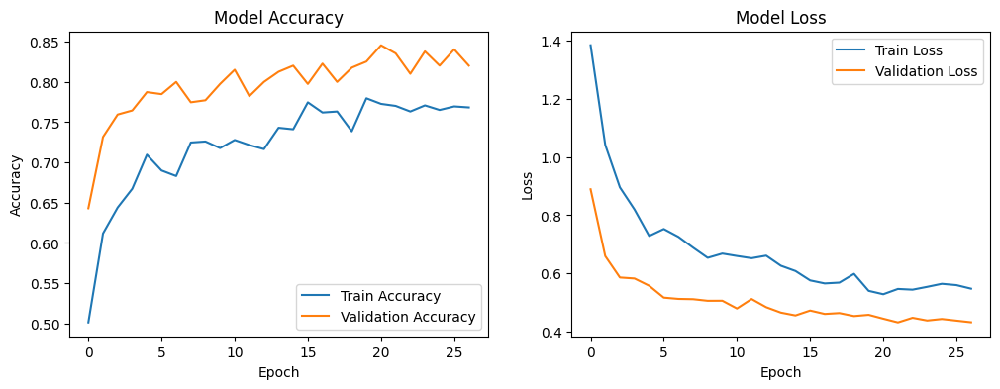

In [ ]:
# Plot training & validation accuracy and loss values
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(history.history['accuracy'], label='Train Accuracy')
axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
axes[0].set_title('Model Accuracy')
axes[0].set_ylabel('Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(loc='best')

axes[1].plot(history.history['loss'], label='Train Loss')
axes[1].plot(history.history['val_loss'], label='Validation Loss')
axes[1].set_title('Model Loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(loc='best')

plt.show()

In [ ]:
# Print the model architecture
model.summary()


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

16/16 [==============================] - 3s 185ms/step
Classification Report:

              precision    recall  f1-score   support

    bleached       0.90      0.84      0.87       181
     healthy       0.88      0.88      0.88       166
   partially       0.76      0.82      0.79       148

    accuracy                           0.85       495
   macro avg       0.85      0.85      0.85       495
weighted avg       0.85      0.85      0.85       495



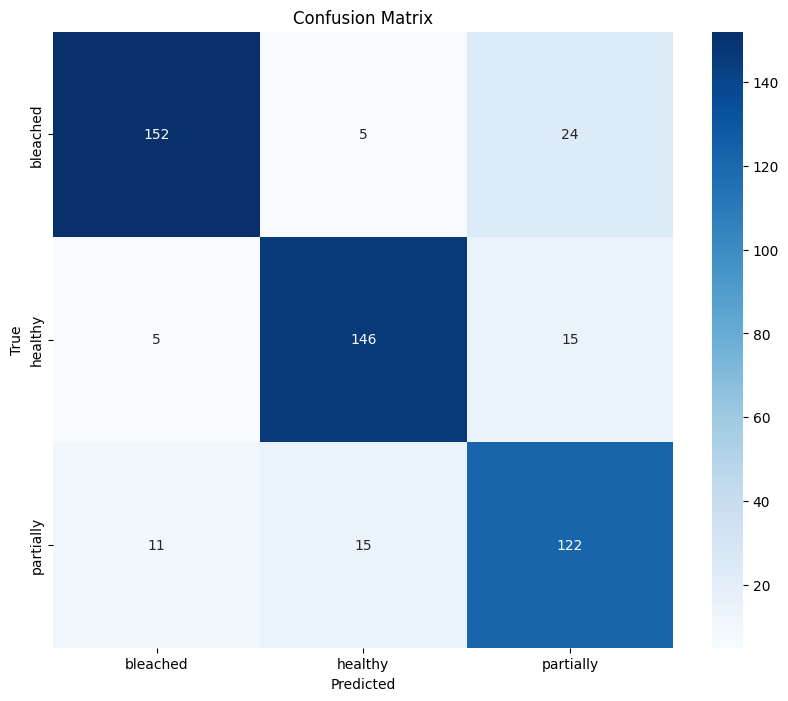

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# Predict on the test set
test_generator.reset()
pred = model.predict(test_generator, steps=len(test_generator), verbose=1)
predicted_class_indices = np.argmax(pred, axis=1)

# Get the ground truth labels
true_class_indices = test_generator.classes

# Get class labels
class_labels = list(test_generator.class_indices.keys())

# Classification report
print("Classification Report:\n")
print(classification_report(true_class_indices, predicted_class_indices, target_names=class_labels))

# Confusion matrix
conf_matrix = confusion_matrix(true_class_indices, predicted_class_indices)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


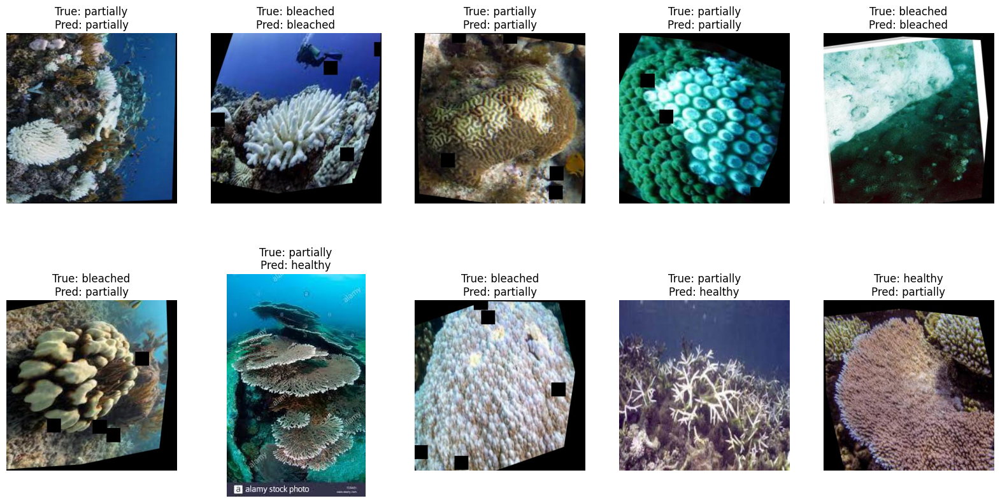

In [ ]:
def visualize_predictions(generator, predictions, true_labels, class_labels, num_images=5):
    plt.figure(figsize=(20, 10))
    correct_indices = np.where(predictions == true_labels)[0]
    incorrect_indices = np.where(predictions != true_labels)[0]

    # Display correct predictions
    for i, correct in enumerate(correct_indices[:num_images]):
        plt.subplot(2, num_images, i + 1)
        plt.imshow(PIL.Image.open(generator.filepaths[correct]))
        plt.title(f"True: {class_labels[true_labels[correct]]}\nPred: {class_labels[predictions[correct]]}")
        plt.axis('off')

    # Display incorrect predictions
    for i, incorrect in enumerate(incorrect_indices[:num_images]):
        plt.subplot(2, num_images, i + num_images + 1)
        plt.imshow(PIL.Image.open(generator.filepaths[incorrect]))
        plt.title(f"True: {class_labels[true_labels[incorrect]]}\nPred: {class_labels[predictions[incorrect]]}")
        plt.axis('off')

    plt.show()

# Visualize predictions
visualize_predictions(test_generator, predicted_class_indices, true_class_indices, class_labels)


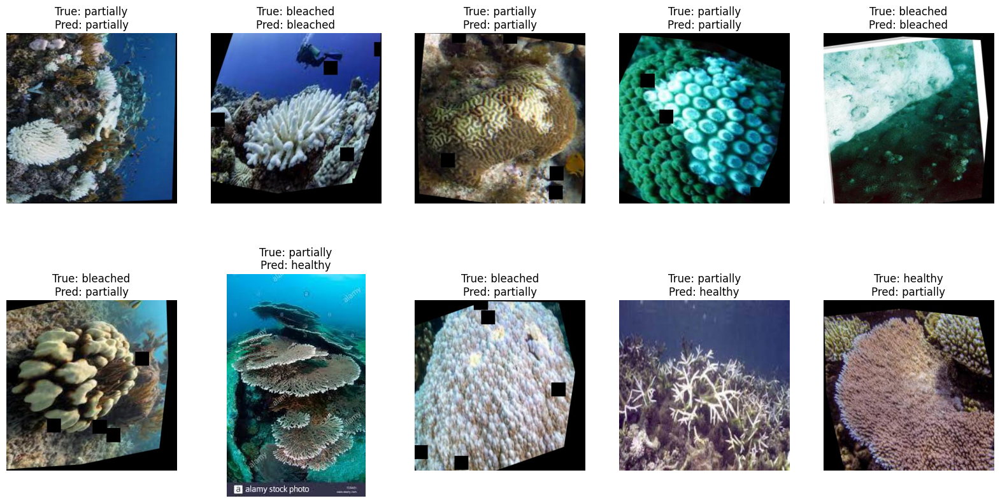

In [ ]:
def visualize_predictions(generator, predictions, true_labels, class_labels, num_images=5):
    plt.figure(figsize=(20, 10))
    correct_indices = np.where(predictions == true_labels)[0]
    incorrect_indices = np.where(predictions != true_labels)[0]

    # Display correct predictions
    for i, correct in enumerate(correct_indices[:num_images]):
        plt.subplot(2, num_images, i + 1)
        plt.imshow(PIL.Image.open(generator.filepaths[correct]))
        plt.title(f"True: {class_labels[true_labels[correct]]}\nPred: {class_labels[predictions[correct]]}")
        plt.axis('off')

    # Display incorrect predictions
    for i, incorrect in enumerate(incorrect_indices[:num_images]):
        plt.subplot(2, num_images, i + num_images + 1)
        plt.imshow(PIL.Image.open(generator.filepaths[incorrect]))
        plt.title(f"True: {class_labels[true_labels[incorrect]]}\nPred: {class_labels[predictions[incorrect]]}")
        plt.axis('off')

    plt.show()

# Visualize predictions
visualize_predictions(test_generator, predicted_class_indices, true_class_indices, class_labels)


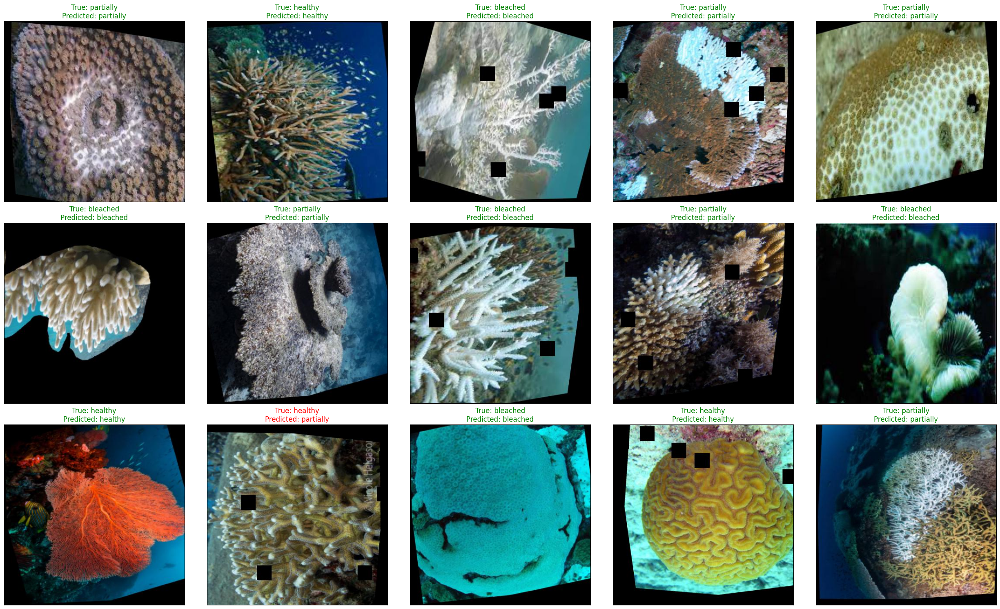

In [ ]:
def visualize_random_samples(test_df, predictions, class_labels):
    random_index = np.random.randint(0, len(test_df) - 1, 15)
    fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15), subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        img_path = test_df.Filepath.iloc[random_index[i]]
        img = plt.imread(img_path)
        ax.imshow(img)

        true_label = test_df.Label.iloc[random_index[i]]
        predicted_label = class_labels[predictions[random_index[i]]]

        if true_label == predicted_label:
            color = "green"
        else:
            color = "red"

        ax.set_title(f"True: {true_label}\nPredicted: {predicted_label}", color=color)

    plt.tight_layout()
    plt.show()

# Visualize random samples from the test set
visualize_random_samples(test_df, predicted_class_indices, class_labels)


1/1 [==============================] - 1s 1s/step


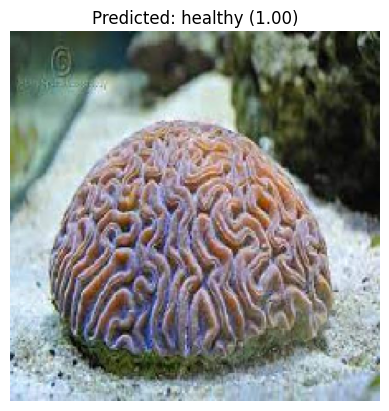

In [ ]:
def predict_single_image(model, image_path, class_labels, target_size=(224, 224)):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = tf.keras.applications.vgg19.preprocess_input(img_array)

    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction, axis=1)[0]
    confidence = prediction[0][predicted_class]

    plt.imshow(img)
    plt.title(f"Predicted: {class_labels[predicted_class]} ({confidence:.2f})")
    plt.axis('off')
    plt.show()

# Predict on a single image
image_path = "/content/drive/MyDrive/Colab Notebooks/CORAL REEF/USE/test/healthy/brain_9_jpg.rf.df23f7dadabdc3344b09986c3bbce2ac.jpg"
predict_single_image(model, image_path, class_labels)


1/1 [==============================] - 0s 18ms/step


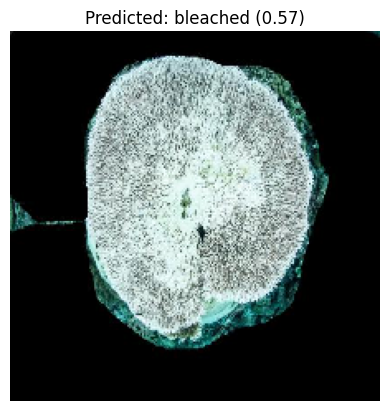

In [ ]:
def predict_single_image(model, image_path, class_labels, target_size=(224, 224)):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = tf.keras.applications.vgg19.preprocess_input(img_array)

    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction, axis=1)[0]
    confidence = prediction[0][predicted_class]

    plt.imshow(img)
    plt.title(f"Predicted: {class_labels[predicted_class]} ({confidence:.2f})")
    plt.axis('off')
    plt.show()

# Predict on a single image
image_path = "/content/drive/MyDrive/Colab Notebooks/CORAL REEF/USE/test/bleached/46_jpg.rf.f418ed9371fc32c1e1c9f761af30c708.jpg"
predict_single_image(model, image_path, class_labels)

1/1 [==============================] - 0s 21ms/step


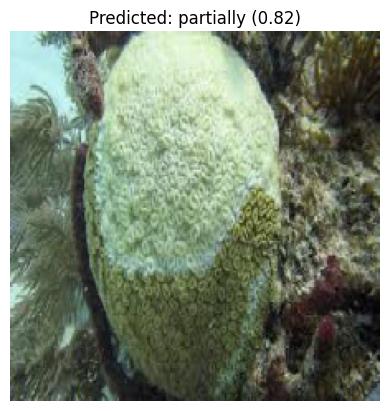

In [ ]:
def predict_single_image(model, image_path, class_labels, target_size=(224, 224)):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = tf.keras.applications.vgg19.preprocess_input(img_array)

    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction, axis=1)[0]
    confidence = prediction[0][predicted_class]

    plt.imshow(img)
    plt.title(f"Predicted: {class_labels[predicted_class]} ({confidence:.2f})")
    plt.axis('off')
    plt.show()

# Predict on a single image
image_path = "/content/drive/MyDrive/Colab Notebooks/CORAL REEF/USE/test/partially/9_jpg.rf.f9a1facadc8e29433c5cbe4e1090b375.jpg"
predict_single_image(model, image_path, class_labels)

In [ ]:
# Define the folder path
folder_path = "/content/drive/MyDrive/Colab Notebooks/CORAL REEF"

# Define the full path including the folder and file name
file_path = folder_path + "coral_classification_final_vgg19.h5"

# Save the model
model.save(file_path)


In [ ]:
import os

# Create the directory if it does not exist
os.makedirs(folder_path, exist_ok=True)


In [ ]:
model_n = model.save("vgg19_coral_classification_final.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from google.colab import files
files.download('/content/vgg19_coral_classification_final.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>